# Ejercicio optativo de Teledetección

**Ejercicio propuesto por: [Mariela Rajngewerc](https://github.com/marielaraj/)**

La imagen original fue bajada de la página del [earthexplorer](https://earthexplorer.usgs.gov/). En esa página se pueden bajar imágenes con distinto nivel de pre-procesamiento. Para este ejercicio bajamos una imagen de nivel de procesamiento 2, esto quiere decir que los valores de los pixeles representan la reflectancia en superficie en distintas longitudes de onda. [Acá](https://www.usgs.gov/media/files/landsat-8-collection-1-land-surface-reflectance-code-product-guide) pueden encontrar el manual de estas imagenes donde les detallan la descripción tanto de los nombres de lor archivos como de los preprocesamiento que tienen realizados. 

Para este ejercicio hemos realizado un clip de cada una de las bandas originales de la imagen y ya multiplicamos a cada una de las bandas por el factor de escala indicado en el manual (0,0001).

Las longitudes de onda y la resoluciones de cada banda de la imágen se describen a continuación:


| Banda                        | Longitud de onda (nanómetros) | Resolución espacial (metros) |
| ---------------------------- | ----------------------------- | ---------------------------- |
| Banda 1 - Aerosoles          | 430 - 450                       | 30                           |
| Banda 2 - Azul               | 450 - 510                       | 30                           |
| Banda 3 - Verde              | 530 - 590                       | 30                           |
| Banda 4 - Rojo               | 640 - 670                       | 30                           |
| Banda 5 - Infrarrojo cercano | 850 - 880                       | 30                           |
| Banda 5 - Infrarrojo medio 1 | 1570 - 1650                   | 30                           |
| Banda 7 - Infrarrojo medio 2 | 2110 - 2290                   | 30                           |


En la carpeta [clip](https://drive.google.com/file/d/1uoigo5s2xgWfbBQdUcJfOdhfYMNjZ8Ku/view?usp=sharing) encontrarán los datos que vamos a usar en los ejercicios. Cada banda del clip se encuentra en formato .npy

# Importamos bibliotecas

Importamos las bibliotecas y abrimos algunas bandas de datos


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
from mpl_toolkits import axes_grid1

def add_colorbar(im, aspect=20, pad_fraction=0.5, **kwargs):
    """Add a vertical color bar to an image plot."""
    divider = axes_grid1.make_axes_locatable(im.axes)
    width = axes_grid1.axes_size.AxesY(im.axes, aspect=1./aspect)
    pad = axes_grid1.axes_size.Fraction(pad_fraction, width)
    current_ax = plt.gca()
    cax = divider.append_axes("right", size=width, pad=pad)
    plt.sca(current_ax)
    return im.axes.figure.colorbar(im, cax=cax, **kwargs)

In [5]:
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Levanto los datos


In [8]:
#Levanto los datos RGB + Infrarrojo
bNIR=np.load('/content/gdrive/MyDrive/Otro/teledeteccion/clip/LC08_L1TP_225084_20180213_20180222_01_T1_sr_band5_clip.npy')
bR=np.load('/content/gdrive/MyDrive/Otro/teledeteccion/clip/LC08_L1TP_225084_20180213_20180222_01_T1_sr_band4_clip.npy')
bG=np.load('/content/gdrive/MyDrive/Otro/teledeteccion/clip/LC08_L1TP_225084_20180213_20180222_01_T1_sr_band3_clip.npy')
bB=np.load('/content/gdrive/MyDrive/Otro/teledeteccion/clip/LC08_L1TP_225084_20180213_20180222_01_T1_sr_band2_clip.npy')



Ploteamos banda roja

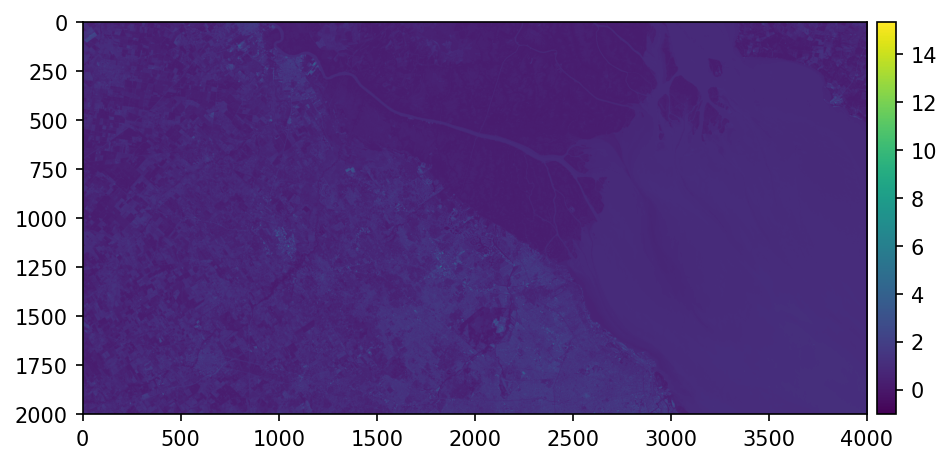

In [9]:
plt.figure(figsize=(7,7), dpi=150)
im = plt.imshow(bR)
add_colorbar(im)

Conviene setear el rango de valores para que se vea mejor. Para saber qué rango, miramos el histograma

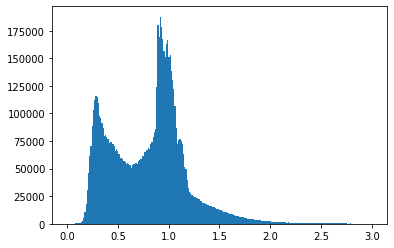

In [ ]:
h=plt.hist(bR.flatten(),bins=250,range=(0,3))

Usemos entonces el rango [0, 2] para visualizar la banda roja

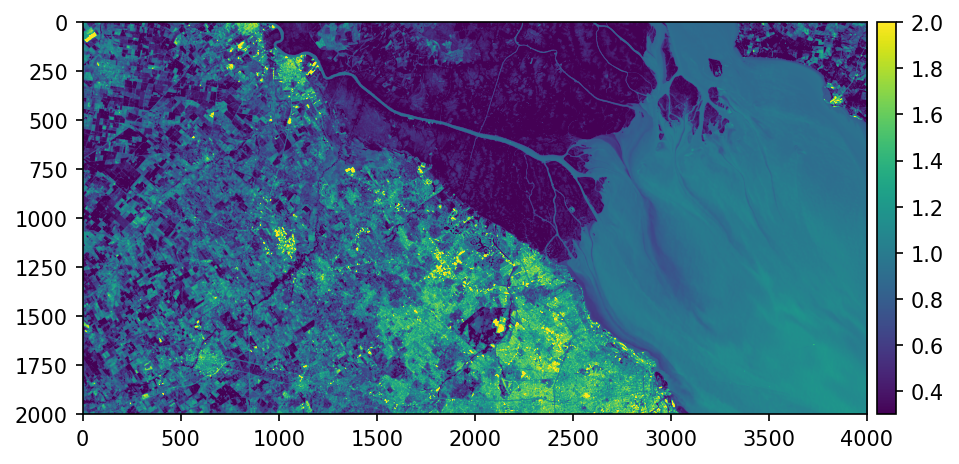

In [ ]:
plt.figure(figsize=(7,7), dpi=150)
im = plt.imshow(bR,vmin=0.3, vmax=2)
add_colorbar(im)

# Miro la Banda Infraroja
Repitamos el procedimiento con NIR (near infrared)

Por un lado podemos ver muchos pixeles con bajo valor esto es el Río de la Plata, posteriormente una distribución gaussiana correspondiente a la tierra.

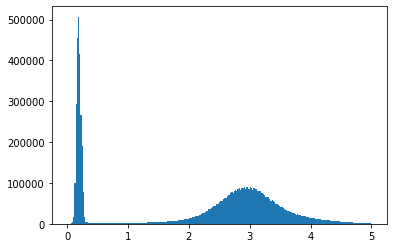

In [ ]:
h=plt.hist(bNIR.flatten(),bins=250,range=(0,5))

Uso ese mismo rango apra visualizar la imágen.

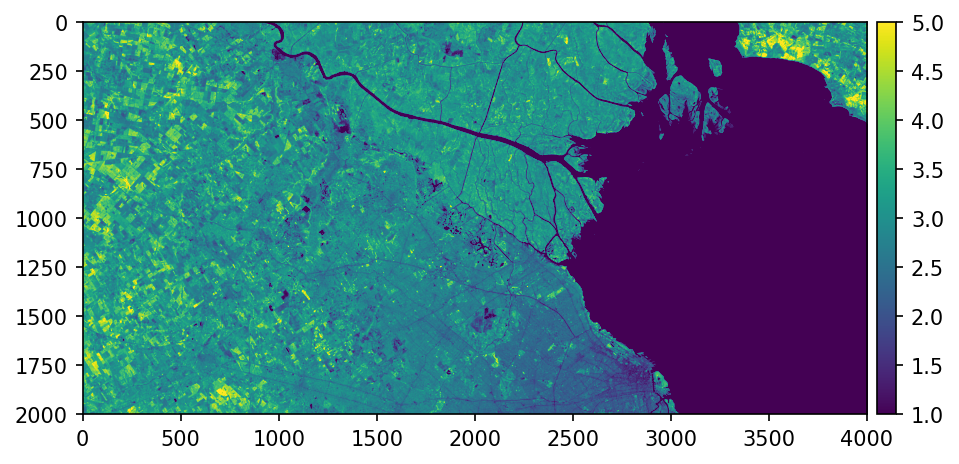

In [10]:
plt.figure(figsize=(7,7), dpi=150)
im = plt.imshow(bNIR,vmin=1, vmax=5)
add_colorbar(im)

Veamos las dos bandas, una bajo la otra


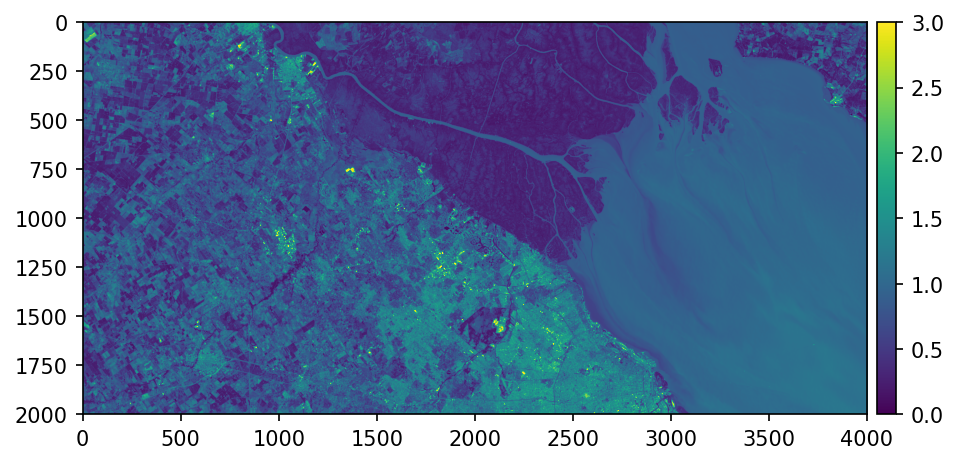

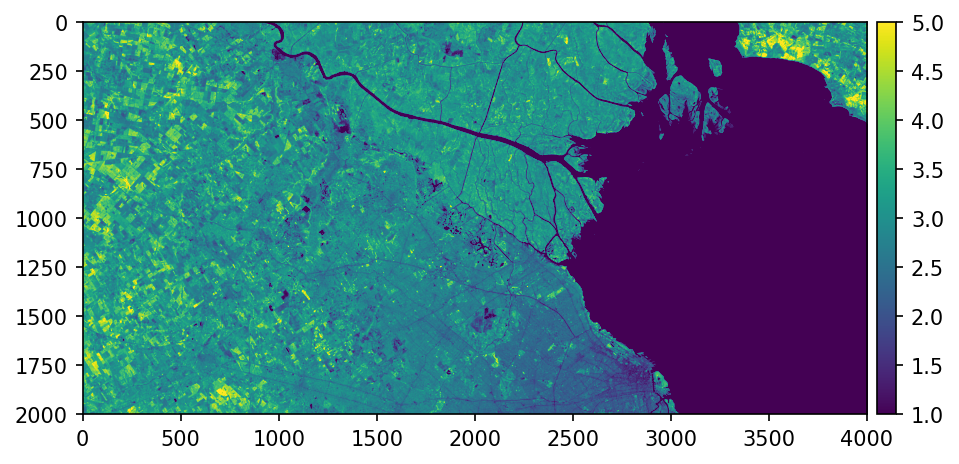

In [11]:
plt.figure(figsize=(7,7), dpi=150)
im = plt.imshow(bR,vmin=0, vmax=3)
add_colorbar(im)
plt.show()
plt.figure(figsize=(7,7), dpi=150)
im = plt.imshow(bNIR,vmin=1, vmax=5)
add_colorbar(im)
plt.show()

En la banda del rojo la vegetacion refleja poco mientras que en el infrarrojo refleja mucho.


* Usamos bandas RBG para crear una imágen bastante realista

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


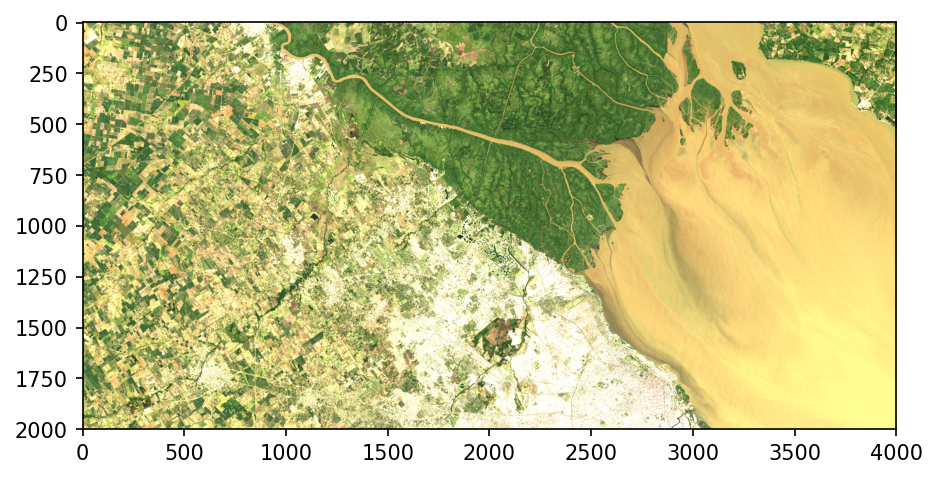

In [12]:
rgb = np.dstack((bR,bG,bB))
plt.figure(figsize=(7,7), dpi=150)
plt.imshow(rgb)

Si modifico las matrices obtengo imagenes con colores "falsos"

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


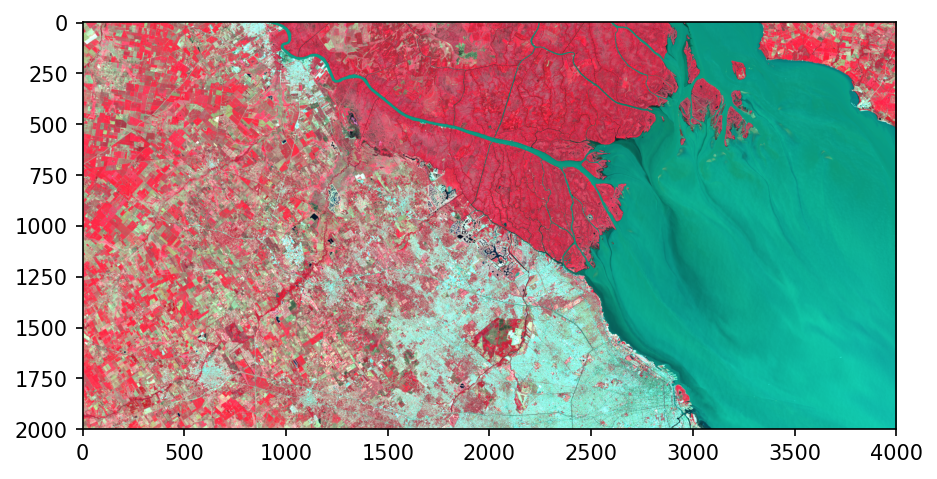

In [ ]:
plt.figure(figsize=(7,7), dpi=150)
rgb = np.dstack((bNIR/4,bR/1.5,bG/1.5))
plt.imshow(rgb)

# El cómputo de atributos: caso NDVI (índice verde)


El Índice de Vegetación de
Diferencia Normalizada, también conocido como NDVI por sus siglas en inglés. Este
índice, basado en la intensidad de la radiación de dos bandas del espectro
electromagnético que interactúan particularmente con la vegetación, aporta
información sobre la cantidad, estado y desarrollo de la misma.
Para calcular el NDVI se utilizan las bandas espectrales Roja e Infrarroja 

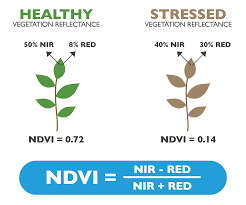





In [13]:
#calculo NDVI y trunco potenciales problemas
ndvi = (bNIR - bR) / (bNIR+bR)

#el nvdi deberia estar acotado entre -1 y 1, por lo cual normalizamos para evitar errores.
ndvi[ndvi>1]=1
ndvi[ndvi<-1]=-1

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  


Graficamos el ndvi:


*   El Rio de la Plata tiene los valores mas pequeños.
*   El Delta los valores mas altos
*   La Ciudad con valores intermedios.



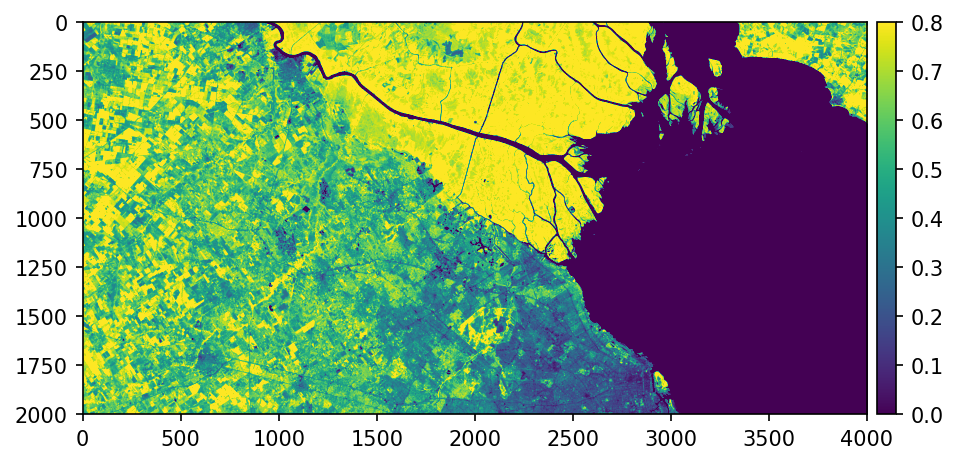

In [18]:
plt.figure(figsize=(7,7), dpi=150)
im = plt.imshow(ndvi,vmin=0, vmax=0.8)
add_colorbar(im)
plt.show()

In [49]:
clases_ndvi = []
for i in ndvi.flatten():
  if i < 0:
    clases_ndvi.append("No vegetada")
  elif (i >= 0) & (i <0.1):
    clases_ndvi.append("Área desnuda")
  elif (i >= 0.1) & (i<0.25):
    clases_ndvi.append("Vegetación baja")
  elif (i >= 0.25) & (i<0.4):
    clases_ndvi.append("Vegetación moderada")
  else:
    clases_ndvi.append("Vegetación densa")

Distribución de clases según vegetación

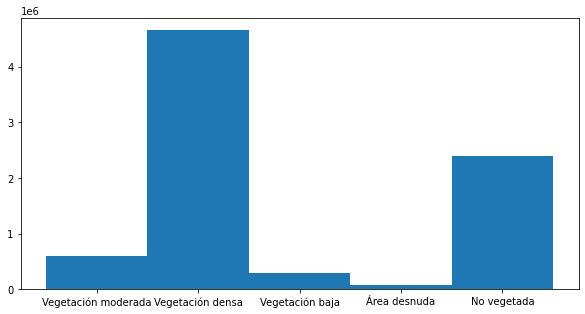

In [60]:
plt.figure(figsize=(10,5))
h = plt.hist(clases_ndvi, bins=np.arange(6)-0.5)

Clases en el mapa:

In [77]:
clases_ndvi = []
for i in ndvi.flatten():
  if i < 0:
    clases_ndvi.append(0)
  elif (i >= 0) & (i <0.1):
    clases_ndvi.append(1)
  elif (i >= 0.1) & (i<0.25):
    clases_ndvi.append(2)
  elif (i >= 0.25) & (i<0.4):
    clases_ndvi.append(3)
  else:
    clases_ndvi.append(4)

clases_ndvi = np.array(clases_ndvi).reshape(ndvi.shape)

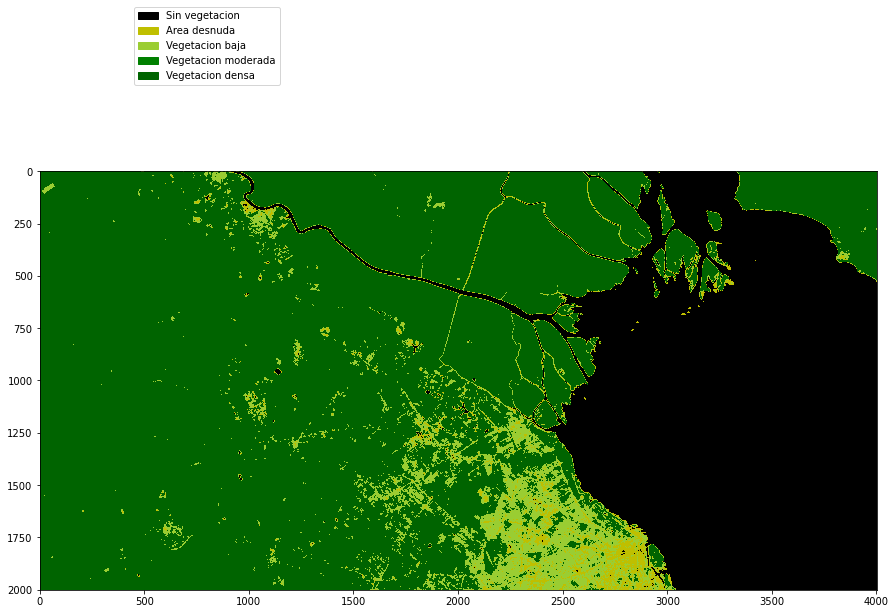

In [83]:
from matplotlib import colors
import matplotlib.patches as mpatches

# Creo colores
cmap = colors.ListedColormap(['black', 'y',
                              'yellowgreen', 'green', 'darkgreen'])
# Defino los limites de cada color
limites = [0, 1, 2, 3, 4]
norm = colors.BoundaryNorm(limites, cmap.N)


# Genero leyenda y grafico con leyenda
texts = ['Sin vegetacion', 'Area desnuda', 'Vegetacion baja',
         'Vegetacion moderada', 'Vegetacion densa']
patches = [mpatches.Patch(color=cmap(i), label="{:s}".format(texts[i]) ) for i in range(len(texts))]

plt.figure(figsize=(15,8))

plt.legend(handles=patches, bbox_to_anchor=(0.2,1.3), loc='center', ncol=1 )
plt.imshow(clases_ndvi, cmap=cmap, norm=norm)
plt.show()

# Recortes (clips)

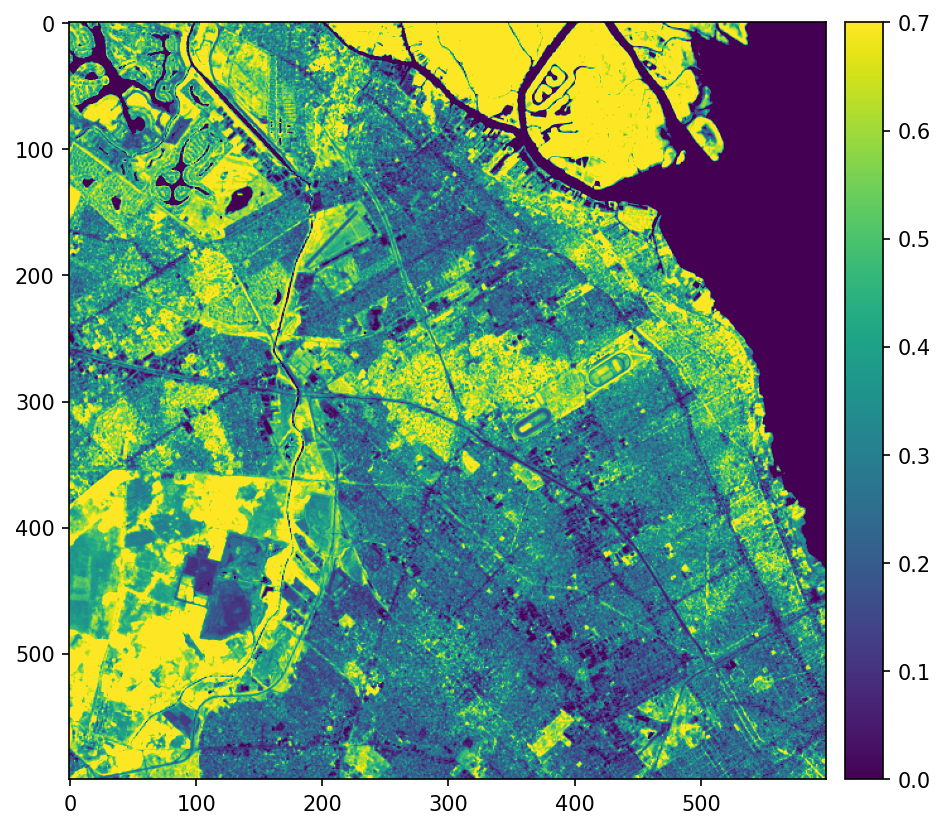

In [17]:
#elijo un clip de 600x600 pequeño para hacer las pruebas
sy = 1100
sx = 2000
dx = 600
dy = 600
clip = ndvi[sy:sy+dy, sx:sx+dx]
plt.figure(figsize=(7,7), dpi=150)
im =plt.imshow(clip,vmin=0,vmax=.7)
add_colorbar(im)
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


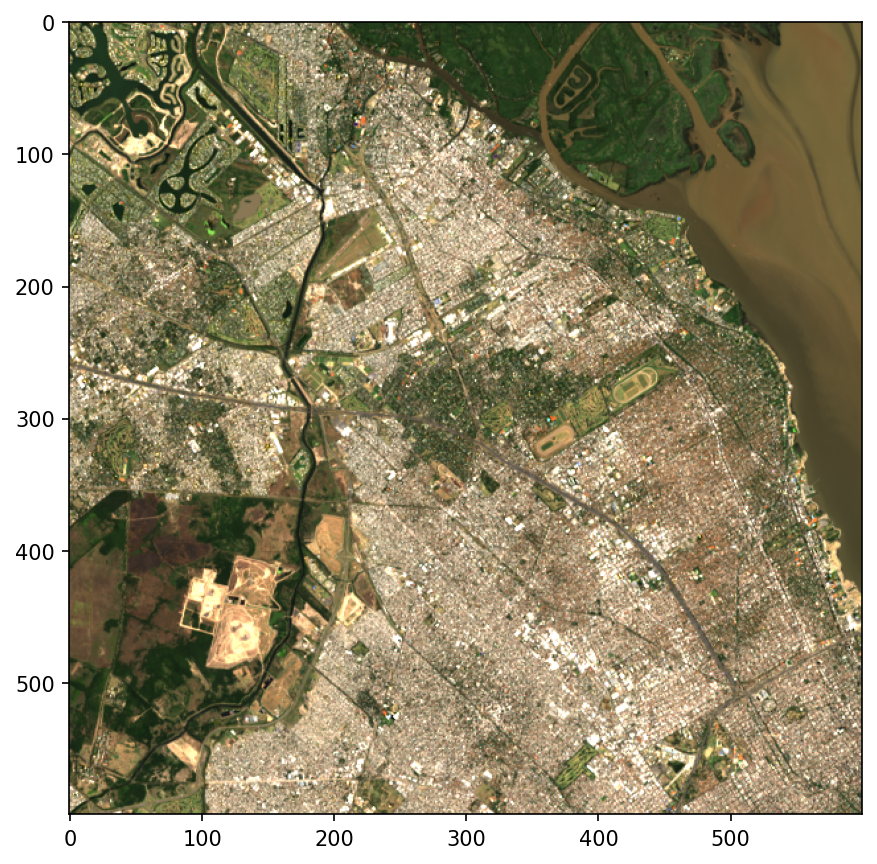

In [19]:
rgb = np.dstack((bR[sy:sy+dy, sx:sx+dx]/2,bG[sy:sy+dy, sx:sx+dx]/2,bB[sy:sy+dy, sx:sx+dx]/2))
plt.figure(figsize=(7,7), dpi=150)
plt.imshow(rgb)

#  El caso de kmeans

Usamos un algoritmo de clustering para obtener clusters de pixels similares a partir de los datos de NDVI calculados antes.

In [21]:
#importo el clasificador y defino una instancia para clasificar con dos etiquetas
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2)

#le saco la estructura bidimensional a la matriz NDVI y la llamo datos
datos = clip.reshape(-1,1)
datos.shape


(360000, 1)

In [23]:
#entreno o ajusto el el clasificador con los datos 
kmeans.fit(datos)
#usa el modelo ajustado para poner etiquetas
etiquetas = kmeans.predict(clip.reshape(-1,1)) 

Visualizamos los resultados

Distingue pixeles con y sin agua.

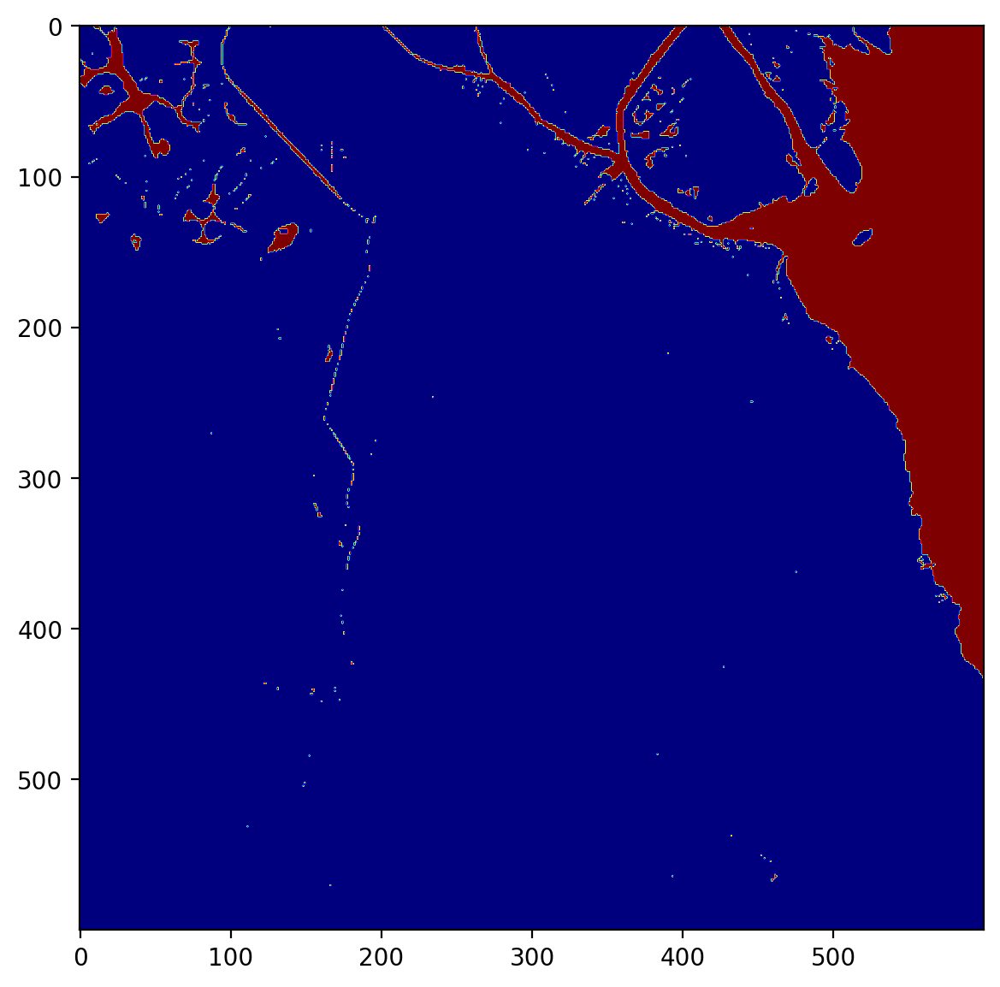

In [24]:

#visualizo los resultado,s recuperando la estructura de matriz
plt.figure(figsize=(7,7), dpi=200)
im = plt.imshow(etiquetas.reshape(clip.shape),cmap='jet')
#add_colorbar(im)
plt.show()



Ahora con tres clases

Tenemos agua, y dentro de la tierra tenemos dos clases: mucha vegetación y poca vegetación

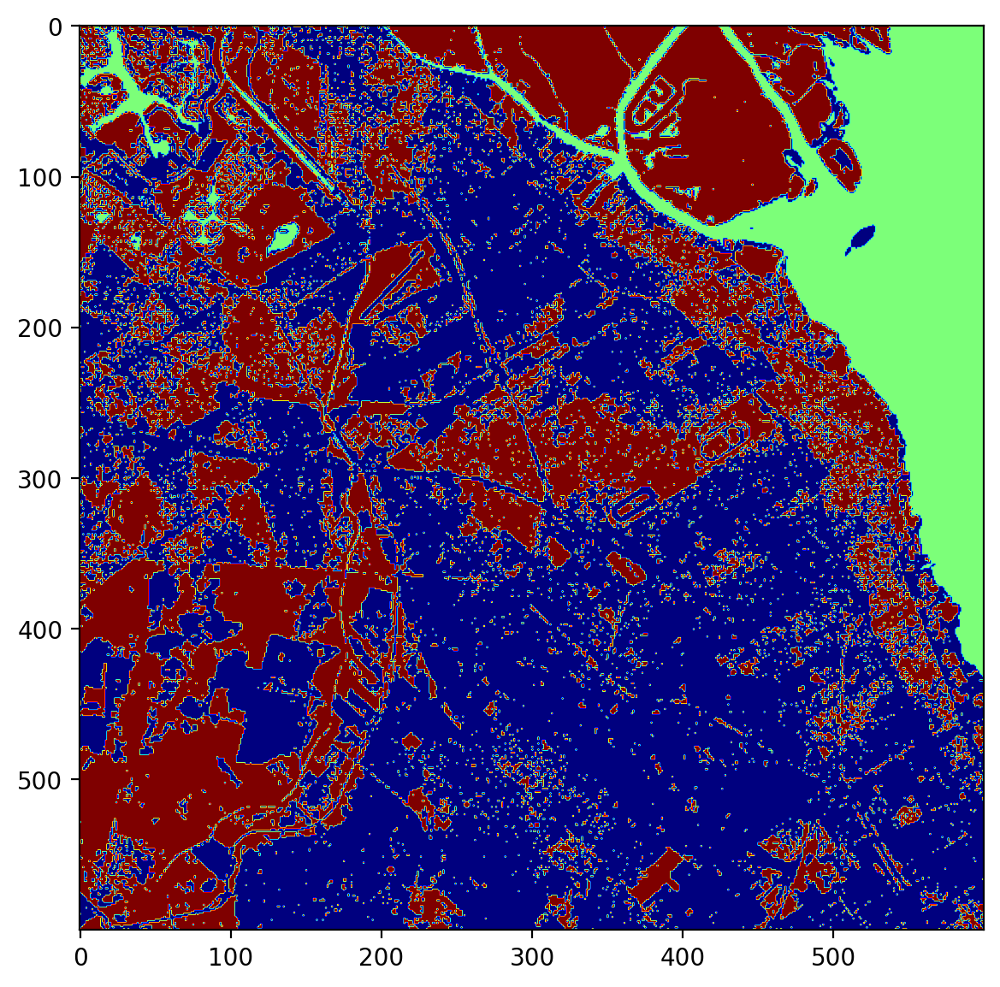

In [26]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(datos)
etiquetas = kmeans.predict(clip.reshape(-1,1)) 


#visualizo los resultado,s recuperando la estructura de matriz
plt.figure(figsize=(7,7), dpi=200)
im = plt.imshow(etiquetas.reshape(clip.shape),cmap='jet')
#add_colorbar(im)
plt.show()

Con mas clases podemos empezar a ver diferentes grados de urbanización

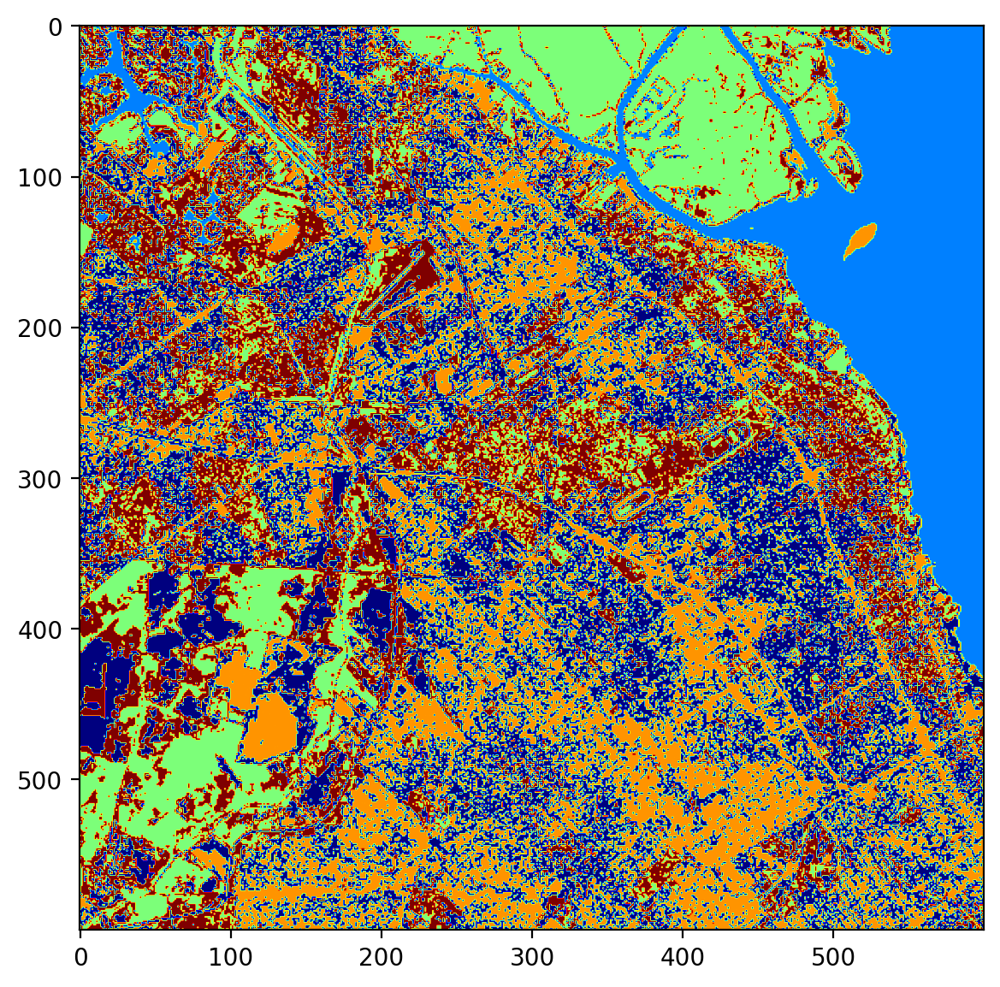

In [29]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(datos)
etiquetas = kmeans.predict(clip.reshape(-1,1)) 


#visualizo los resultado,s recuperando la estructura de matriz
plt.figure(figsize=(7,7), dpi=200)
im = plt.imshow(etiquetas.reshape(clip.shape),cmap='jet')
#add_colorbar(im)
plt.show()